# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [6]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:10<00:00, 5.74KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

/usr/local/lib/python3.5/dist-packages/matplotlib/font_manager.py:280: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  'Matplotlib is building the font cache using fc-list. '


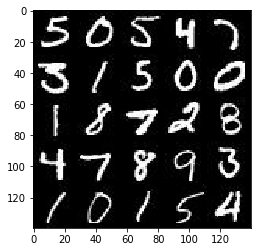

In [7]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

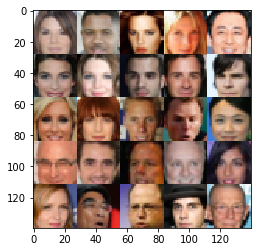

In [8]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [9]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [29]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels],
                                  name='input_images')
    input_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, [], name='learning_rate')
    return input_images, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


In [13]:
def leaky_ReLU(x, alpha=0.2):
    """
    Computes leaky rectified linear: `max(alpha*x, x)`.
    :param x: Tensor of features
    :param alpha: The coefficient of leakage, a real number
    :return: Tensor of the same type as `x`.
    """
    return tf.maximum(alpha*x, x)

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [120]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):

        # conv_1, no batch normalization
        x = tf.layers.conv2d(images, 32, 5, strides=2, padding='same')
        x = leaky_ReLU(x)
        
        # conv_2
        x = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = leaky_ReLU(x)

        # conv_3
        x = tf.layers.conv2d(x, 128, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = leaky_ReLU(x)

        # conv_4
        x = tf.layers.conv2d(x, 256, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = leaky_ReLU(x)

        # flatten and dense layer
        x = tf.contrib.layers.flatten(x)
        logits = tf.layers.dense(x, 1)
        outputs = tf.sigmoid(logits)

    return outputs, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [109]:
# inspired by https://distill.pub/2016/deconv-checkerboard/

def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*512)
        x = tf.reshape(x, [-1, 4, 4, 512])
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leaky_ReLU(x)
        
        # resize_1
        x = tf.image.resize_images(x, size=[7,7])
        x = tf.layers.conv2d(x, 128, 5, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leaky_ReLU(x)
        
        # resize_2
        x = tf.image.resize_images(x, size=[14,14])
        x = tf.layers.conv2d(x, 64, 5, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leaky_ReLU(x)
        
        # resize_3
        x = tf.image.resize_images(x, size=[28,28])
        x = tf.layers.conv2d(x, 32, 5, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = leaky_ReLU(x)
        
        # final convolution
        logits = tf.layers.conv2d(x, out_channel_dim, 5, strides=1, padding='same')
        outputs = tf.tanh(logits)
    
    return outputs


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In [95]:
# This version works well, by I decided to go with the other one.

# def generator(z, out_channel_dim, is_train=True):
#     """
#     Create the generator network
#     :param z: Input z
#     :param out_channel_dim: The number of channels in the output image
#     :param is_train: Boolean if generator is being used for training
#     :return: The tensor output of the generator
#     """
#     # TODO: Implement Function
#     with tf.variable_scope('generator', reuse=not is_train):
#         x = tf.layers.dense(z, 2*2*512)
#         x = tf.reshape(x, (-1, 2, 2, 512))
#         x = tf.layers.batch_normalization(x, training=is_train)
#         x = leaky_ReLU(x)
    
#         x = tf.layers.conv2d_transpose(x, 256, 5, 2, padding='valid')
#         x = tf.layers.batch_normalization(x, training=is_train)
#         x = leaky_ReLU(x)
        
#         x = tf.layers.conv2d_transpose(x, 128, 5, 2, padding='same')
#         x = tf.layers.batch_normalization(x, training=is_train)
#         x = leaky_ReLU(x)
        
#         logits = tf.layers.conv2d_transpose(x, out_channel_dim, 4, 2, padding='same')
#         outputs = tf.tanh(logits)
    
#         return outputs

# """
# DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
# """
# tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [16]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    fake_images = generator(input_z, out_channel_dim)
    _, d_logits_real = discriminator(input_real)
    _, d_logits_fake = discriminator(fake_images, reuse=True)
    
    generator_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    
    discrimator_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=0.9*tf.ones_like(d_logits_real)))
    
    discrimator_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    
    discrimator_loss = discrimator_loss_real + discrimator_loss_fake
    
    return discrimator_loss, generator_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [17]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # This is the same function found in the DCGAN exercise:
    # https://github.com/udacity/deep-learning/blob/master/dcgan-svhn/DCGAN.ipynb
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [18]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [72]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    # This function is a modified version the train function in the DCGAN exercise:
    # https://github.com/udacity/deep-learning/blob/master/dcgan-svhn/DCGAN.ipynb
    
    _, image_width, image_height, image_channels = data_shape
    input_images, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_images, input_z, image_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    print_every = 10
    show_every = 30
    steps = 0
    n_images = 25
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                # Change the range of the images to [-1,1]
                batch_images *= 2 
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_train_opt, {input_images: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, {input_images: batch_images, input_z: batch_z, lr: learning_rate})
            
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_images: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode) 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.3026... Generator Loss: 5.5201
Epoch 1/2... Discriminator Loss: 2.7421... Generator Loss: 6.0391
Epoch 1/2... Discriminator Loss: 2.4066... Generator Loss: 5.5012


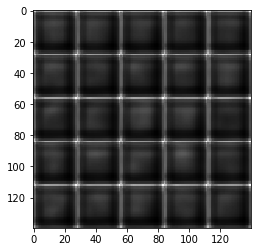

Epoch 1/2... Discriminator Loss: 1.5767... Generator Loss: 3.0975
Epoch 1/2... Discriminator Loss: 1.6638... Generator Loss: 3.0886
Epoch 1/2... Discriminator Loss: 1.6086... Generator Loss: 2.9239


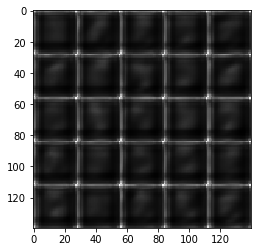

Epoch 1/2... Discriminator Loss: 1.5619... Generator Loss: 2.2862
Epoch 1/2... Discriminator Loss: 1.4980... Generator Loss: 2.3072
Epoch 1/2... Discriminator Loss: 1.5168... Generator Loss: 2.4478


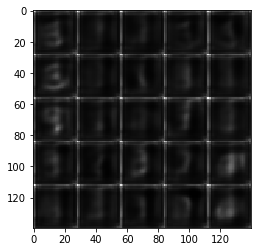

Epoch 1/2... Discriminator Loss: 1.4335... Generator Loss: 1.5613
Epoch 1/2... Discriminator Loss: 1.5901... Generator Loss: 1.8962
Epoch 1/2... Discriminator Loss: 1.5210... Generator Loss: 2.0051


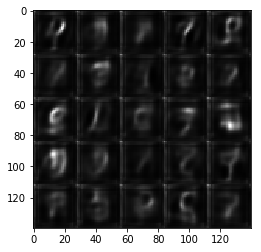

Epoch 1/2... Discriminator Loss: 1.2661... Generator Loss: 1.5027
Epoch 1/2... Discriminator Loss: 1.4609... Generator Loss: 1.4792
Epoch 1/2... Discriminator Loss: 1.3562... Generator Loss: 1.1947


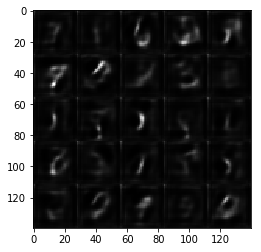

Epoch 1/2... Discriminator Loss: 1.2634... Generator Loss: 1.5370
Epoch 1/2... Discriminator Loss: 1.3962... Generator Loss: 1.3125
Epoch 1/2... Discriminator Loss: 1.3041... Generator Loss: 1.6730


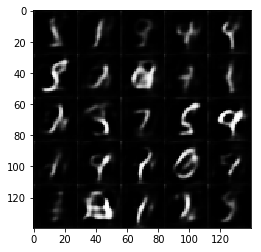

Epoch 1/2... Discriminator Loss: 1.3769... Generator Loss: 1.2888
Epoch 1/2... Discriminator Loss: 1.2064... Generator Loss: 1.3933
Epoch 1/2... Discriminator Loss: 1.4782... Generator Loss: 1.4997


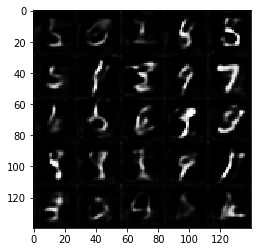

Epoch 1/2... Discriminator Loss: 1.1123... Generator Loss: 1.6177
Epoch 1/2... Discriminator Loss: 1.2060... Generator Loss: 0.9796
Epoch 1/2... Discriminator Loss: 1.1791... Generator Loss: 0.8448


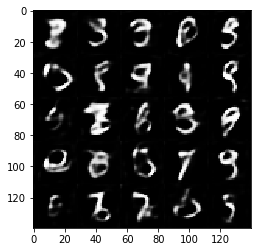

Epoch 1/2... Discriminator Loss: 1.5842... Generator Loss: 0.4136
Epoch 1/2... Discriminator Loss: 1.3560... Generator Loss: 0.5666
Epoch 1/2... Discriminator Loss: 1.6759... Generator Loss: 0.3480


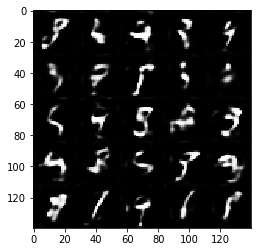

Epoch 1/2... Discriminator Loss: 1.6221... Generator Loss: 0.3721
Epoch 1/2... Discriminator Loss: 1.4673... Generator Loss: 0.4419
Epoch 1/2... Discriminator Loss: 1.5458... Generator Loss: 0.4319


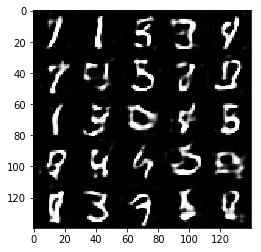

Epoch 1/2... Discriminator Loss: 1.5074... Generator Loss: 0.4717
Epoch 1/2... Discriminator Loss: 1.6728... Generator Loss: 0.3608
Epoch 1/2... Discriminator Loss: 1.3620... Generator Loss: 0.5842


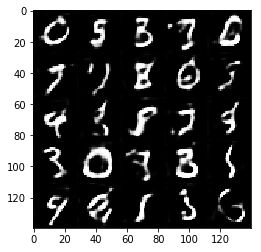

Epoch 1/2... Discriminator Loss: 1.5288... Generator Loss: 0.4852
Epoch 1/2... Discriminator Loss: 1.3959... Generator Loss: 0.5159
Epoch 1/2... Discriminator Loss: 1.5879... Generator Loss: 0.4068


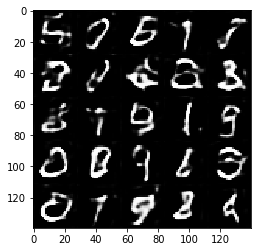

Epoch 1/2... Discriminator Loss: 1.4960... Generator Loss: 0.4790
Epoch 1/2... Discriminator Loss: 1.4451... Generator Loss: 0.4695
Epoch 1/2... Discriminator Loss: 1.6945... Generator Loss: 0.3329


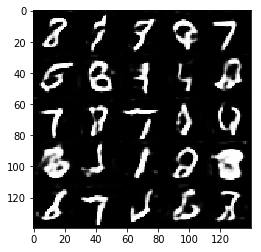

Epoch 1/2... Discriminator Loss: 1.3003... Generator Loss: 0.7105
Epoch 1/2... Discriminator Loss: 1.7457... Generator Loss: 0.3429
Epoch 1/2... Discriminator Loss: 1.6613... Generator Loss: 0.3638


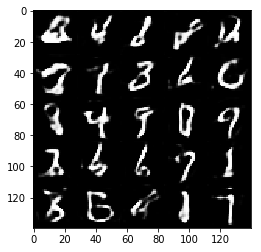

Epoch 1/2... Discriminator Loss: 1.5331... Generator Loss: 0.4297
Epoch 1/2... Discriminator Loss: 1.4867... Generator Loss: 0.4518
Epoch 1/2... Discriminator Loss: 1.2008... Generator Loss: 0.7134


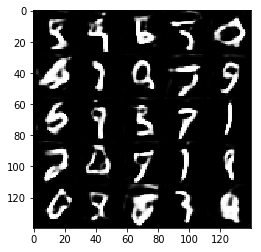

Epoch 1/2... Discriminator Loss: 1.4178... Generator Loss: 0.4778
Epoch 1/2... Discriminator Loss: 1.5194... Generator Loss: 0.4381
Epoch 1/2... Discriminator Loss: 1.2457... Generator Loss: 0.7742


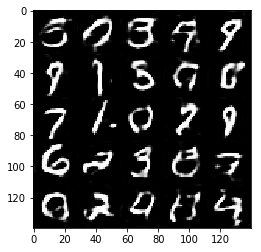

Epoch 1/2... Discriminator Loss: 1.9972... Generator Loss: 0.2406
Epoch 1/2... Discriminator Loss: 1.5212... Generator Loss: 0.4264
Epoch 1/2... Discriminator Loss: 1.2618... Generator Loss: 0.6543


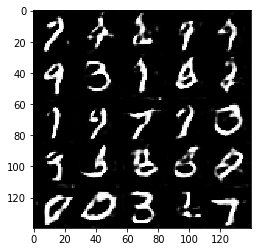

Epoch 1/2... Discriminator Loss: 1.6535... Generator Loss: 0.3505
Epoch 1/2... Discriminator Loss: 1.4611... Generator Loss: 0.5010
Epoch 1/2... Discriminator Loss: 1.4680... Generator Loss: 0.4838


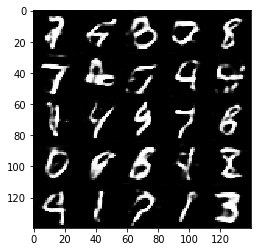

Epoch 1/2... Discriminator Loss: 1.5573... Generator Loss: 0.3915
Epoch 1/2... Discriminator Loss: 1.6083... Generator Loss: 0.3823
Epoch 1/2... Discriminator Loss: 1.4253... Generator Loss: 0.5161


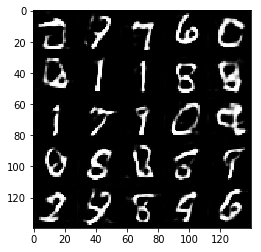

Epoch 1/2... Discriminator Loss: 1.1979... Generator Loss: 0.7602
Epoch 1/2... Discriminator Loss: 1.6551... Generator Loss: 0.3816
Epoch 1/2... Discriminator Loss: 1.3469... Generator Loss: 0.5521


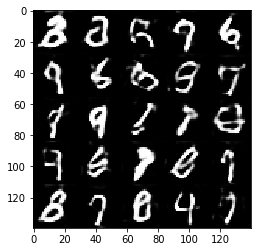

Epoch 1/2... Discriminator Loss: 1.2851... Generator Loss: 0.6307
Epoch 1/2... Discriminator Loss: 1.6475... Generator Loss: 0.3610
Epoch 1/2... Discriminator Loss: 1.3076... Generator Loss: 0.6027


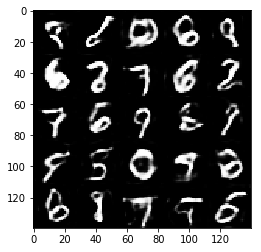

Epoch 1/2... Discriminator Loss: 1.5254... Generator Loss: 0.4310
Epoch 1/2... Discriminator Loss: 1.4971... Generator Loss: 0.4309
Epoch 1/2... Discriminator Loss: 1.5169... Generator Loss: 0.4397


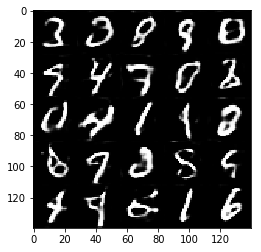

Epoch 1/2... Discriminator Loss: 1.3415... Generator Loss: 0.5571
Epoch 1/2... Discriminator Loss: 1.7780... Generator Loss: 0.3064
Epoch 1/2... Discriminator Loss: 1.0405... Generator Loss: 0.8840


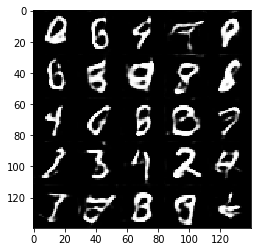

Epoch 1/2... Discriminator Loss: 1.6898... Generator Loss: 0.3320
Epoch 1/2... Discriminator Loss: 1.2555... Generator Loss: 0.6649
Epoch 1/2... Discriminator Loss: 1.5759... Generator Loss: 0.3941


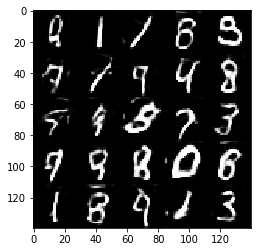

Epoch 1/2... Discriminator Loss: 1.2419... Generator Loss: 0.6235
Epoch 1/2... Discriminator Loss: 1.9812... Generator Loss: 0.2714
Epoch 1/2... Discriminator Loss: 1.2042... Generator Loss: 0.8364


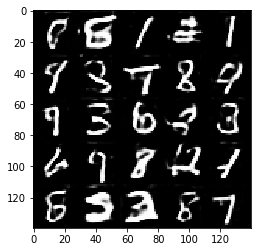

Epoch 1/2... Discriminator Loss: 1.1941... Generator Loss: 1.5060
Epoch 1/2... Discriminator Loss: 1.0554... Generator Loss: 0.8486
Epoch 1/2... Discriminator Loss: 2.0549... Generator Loss: 2.4144


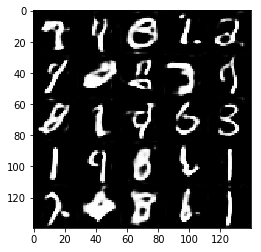

Epoch 1/2... Discriminator Loss: 0.9899... Generator Loss: 1.1281
Epoch 1/2... Discriminator Loss: 1.3064... Generator Loss: 1.5437
Epoch 1/2... Discriminator Loss: 0.9547... Generator Loss: 1.1324


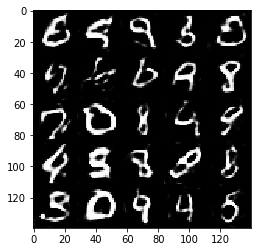

Epoch 1/2... Discriminator Loss: 1.2935... Generator Loss: 0.5571
Epoch 1/2... Discriminator Loss: 1.5284... Generator Loss: 0.4118
Epoch 1/2... Discriminator Loss: 1.4362... Generator Loss: 0.4634


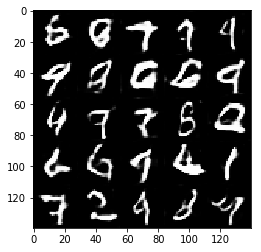

Epoch 1/2... Discriminator Loss: 1.2499... Generator Loss: 0.6896
Epoch 1/2... Discriminator Loss: 2.2542... Generator Loss: 0.1816
Epoch 1/2... Discriminator Loss: 1.1607... Generator Loss: 0.7806


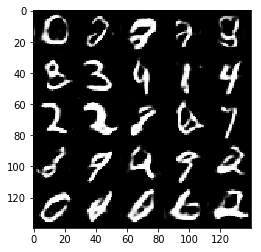

Epoch 1/2... Discriminator Loss: 0.9691... Generator Loss: 1.5356
Epoch 1/2... Discriminator Loss: 0.9604... Generator Loss: 1.0694
Epoch 1/2... Discriminator Loss: 1.3698... Generator Loss: 0.4787


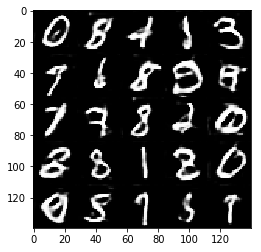

Epoch 1/2... Discriminator Loss: 1.5698... Generator Loss: 0.4061
Epoch 1/2... Discriminator Loss: 1.2603... Generator Loss: 0.5950
Epoch 1/2... Discriminator Loss: 1.6013... Generator Loss: 0.3826


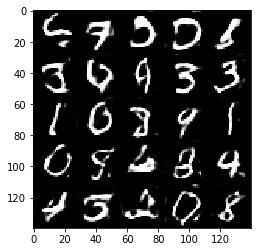

Epoch 2/2... Discriminator Loss: 1.1052... Generator Loss: 0.8402
Epoch 2/2... Discriminator Loss: 1.6192... Generator Loss: 0.3938
Epoch 2/2... Discriminator Loss: 1.1190... Generator Loss: 0.7524


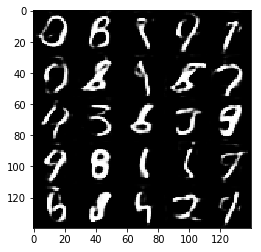

Epoch 2/2... Discriminator Loss: 0.8924... Generator Loss: 1.5647
Epoch 2/2... Discriminator Loss: 1.0587... Generator Loss: 1.1067
Epoch 2/2... Discriminator Loss: 0.9948... Generator Loss: 1.7832


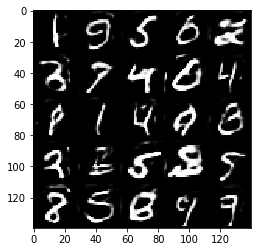

Epoch 2/2... Discriminator Loss: 1.1167... Generator Loss: 1.1436
Epoch 2/2... Discriminator Loss: 1.0713... Generator Loss: 0.7786
Epoch 2/2... Discriminator Loss: 1.1780... Generator Loss: 0.6534


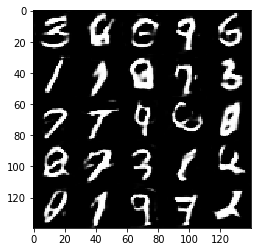

Epoch 2/2... Discriminator Loss: 1.4231... Generator Loss: 0.4925
Epoch 2/2... Discriminator Loss: 1.2244... Generator Loss: 0.6306
Epoch 2/2... Discriminator Loss: 1.6804... Generator Loss: 0.3450


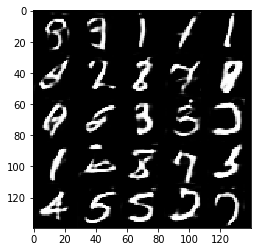

Epoch 2/2... Discriminator Loss: 1.2174... Generator Loss: 0.6323
Epoch 2/2... Discriminator Loss: 1.2515... Generator Loss: 0.6920
Epoch 2/2... Discriminator Loss: 1.0519... Generator Loss: 0.8907


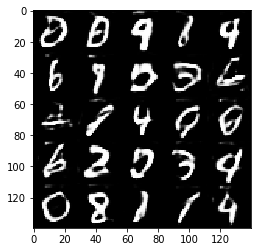

Epoch 2/2... Discriminator Loss: 1.2783... Generator Loss: 1.7278
Epoch 2/2... Discriminator Loss: 0.9309... Generator Loss: 1.1627
Epoch 2/2... Discriminator Loss: 0.8756... Generator Loss: 1.2084


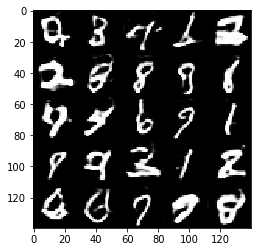

Epoch 2/2... Discriminator Loss: 2.2098... Generator Loss: 0.2496
Epoch 2/2... Discriminator Loss: 1.3693... Generator Loss: 0.4912
Epoch 2/2... Discriminator Loss: 1.0197... Generator Loss: 0.8081


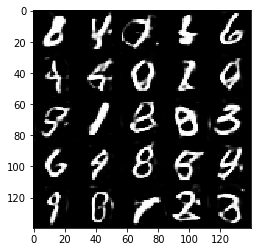

Epoch 2/2... Discriminator Loss: 1.2425... Generator Loss: 2.5024
Epoch 2/2... Discriminator Loss: 0.8337... Generator Loss: 1.2154
Epoch 2/2... Discriminator Loss: 1.5742... Generator Loss: 2.2382


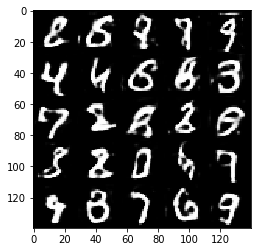

Epoch 2/2... Discriminator Loss: 0.9580... Generator Loss: 1.2020
Epoch 2/2... Discriminator Loss: 1.3174... Generator Loss: 2.1449
Epoch 2/2... Discriminator Loss: 1.2736... Generator Loss: 2.2774


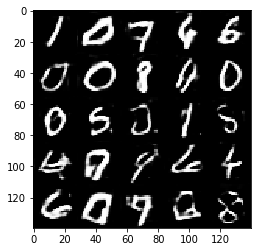

Epoch 2/2... Discriminator Loss: 1.0690... Generator Loss: 1.2868
Epoch 2/2... Discriminator Loss: 0.9461... Generator Loss: 2.0770
Epoch 2/2... Discriminator Loss: 1.1822... Generator Loss: 1.1608


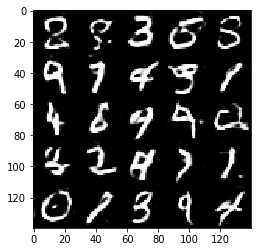

Epoch 2/2... Discriminator Loss: 0.8351... Generator Loss: 1.2541
Epoch 2/2... Discriminator Loss: 2.2469... Generator Loss: 0.1913
Epoch 2/2... Discriminator Loss: 1.3999... Generator Loss: 0.5031


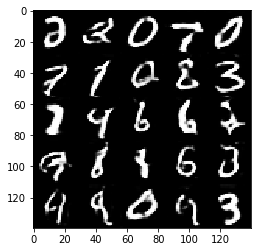

Epoch 2/2... Discriminator Loss: 1.1091... Generator Loss: 0.7932
Epoch 2/2... Discriminator Loss: 1.3110... Generator Loss: 0.5826
Epoch 2/2... Discriminator Loss: 0.9221... Generator Loss: 0.9679


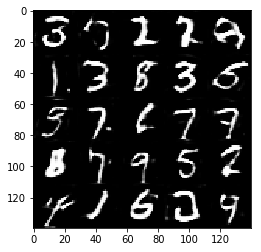

Epoch 2/2... Discriminator Loss: 1.0866... Generator Loss: 0.7580
Epoch 2/2... Discriminator Loss: 1.3251... Generator Loss: 0.5547
Epoch 2/2... Discriminator Loss: 1.0503... Generator Loss: 0.7960


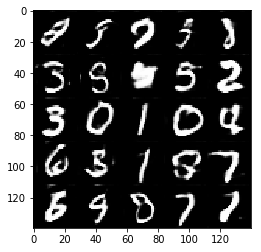

Epoch 2/2... Discriminator Loss: 1.3810... Generator Loss: 0.5124
Epoch 2/2... Discriminator Loss: 1.7025... Generator Loss: 0.3457
Epoch 2/2... Discriminator Loss: 0.7551... Generator Loss: 1.3037


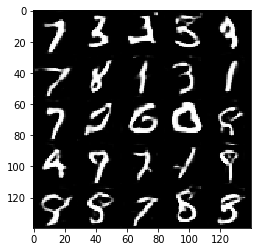

Epoch 2/2... Discriminator Loss: 1.0923... Generator Loss: 1.2024
Epoch 2/2... Discriminator Loss: 1.0751... Generator Loss: 1.6740
Epoch 2/2... Discriminator Loss: 0.9185... Generator Loss: 2.4015


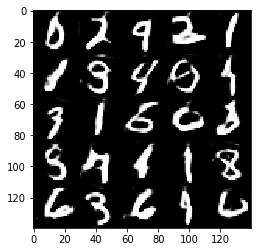

Epoch 2/2... Discriminator Loss: 1.0111... Generator Loss: 2.0851
Epoch 2/2... Discriminator Loss: 0.8654... Generator Loss: 1.6642
Epoch 2/2... Discriminator Loss: 0.9056... Generator Loss: 1.5843


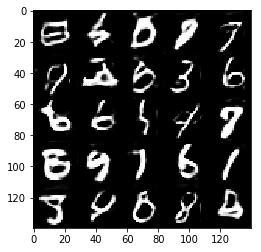

Epoch 2/2... Discriminator Loss: 0.6888... Generator Loss: 1.5031
Epoch 2/2... Discriminator Loss: 2.4135... Generator Loss: 0.1690
Epoch 2/2... Discriminator Loss: 1.4113... Generator Loss: 0.4739


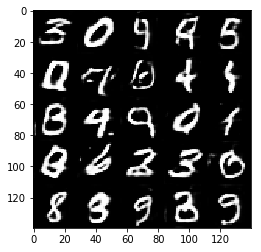

Epoch 2/2... Discriminator Loss: 0.7643... Generator Loss: 1.2080
Epoch 2/2... Discriminator Loss: 1.2133... Generator Loss: 1.5954
Epoch 2/2... Discriminator Loss: 0.8769... Generator Loss: 1.8640


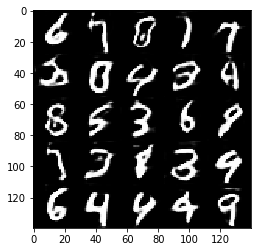

Epoch 2/2... Discriminator Loss: 0.6076... Generator Loss: 1.7569
Epoch 2/2... Discriminator Loss: 2.5410... Generator Loss: 0.1799
Epoch 2/2... Discriminator Loss: 1.1906... Generator Loss: 0.7194


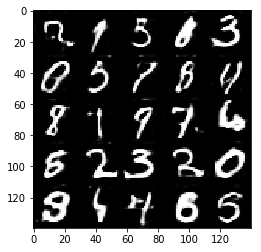

Epoch 2/2... Discriminator Loss: 0.8163... Generator Loss: 1.3152
Epoch 2/2... Discriminator Loss: 0.6697... Generator Loss: 2.0807
Epoch 2/2... Discriminator Loss: 1.2730... Generator Loss: 1.5980


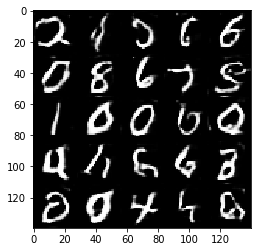

Epoch 2/2... Discriminator Loss: 1.2268... Generator Loss: 1.9653
Epoch 2/2... Discriminator Loss: 0.8459... Generator Loss: 1.1372
Epoch 2/2... Discriminator Loss: 0.9833... Generator Loss: 2.3696


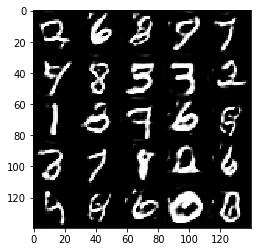

Epoch 2/2... Discriminator Loss: 1.0123... Generator Loss: 1.5848
Epoch 2/2... Discriminator Loss: 0.6222... Generator Loss: 2.2355
Epoch 2/2... Discriminator Loss: 1.0160... Generator Loss: 2.1511


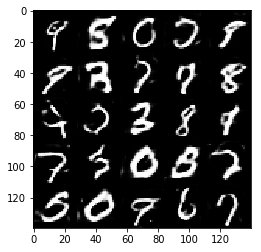

Epoch 2/2... Discriminator Loss: 1.2038... Generator Loss: 0.7038
Epoch 2/2... Discriminator Loss: 0.9087... Generator Loss: 1.4640
Epoch 2/2... Discriminator Loss: 0.8696... Generator Loss: 2.6659


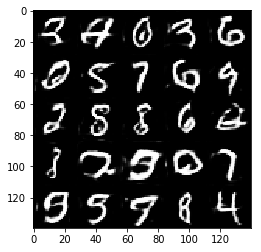

Epoch 2/2... Discriminator Loss: 1.5492... Generator Loss: 2.5644
Epoch 2/2... Discriminator Loss: 0.8104... Generator Loss: 1.1838
Epoch 2/2... Discriminator Loss: 0.7514... Generator Loss: 2.1300


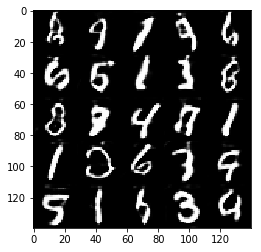

Epoch 2/2... Discriminator Loss: 1.6873... Generator Loss: 2.3631
Epoch 2/2... Discriminator Loss: 0.9458... Generator Loss: 0.9869
Epoch 2/2... Discriminator Loss: 1.0528... Generator Loss: 2.3552


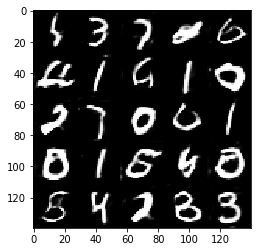

Epoch 2/2... Discriminator Loss: 0.8332... Generator Loss: 1.4201
Epoch 2/2... Discriminator Loss: 0.5832... Generator Loss: 1.9439
Epoch 2/2... Discriminator Loss: 1.7617... Generator Loss: 2.8973


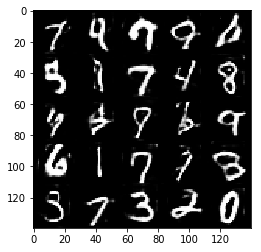

Epoch 2/2... Discriminator Loss: 0.8965... Generator Loss: 1.7929
Epoch 2/2... Discriminator Loss: 1.0738... Generator Loss: 2.2829
Epoch 2/2... Discriminator Loss: 0.8662... Generator Loss: 1.4980


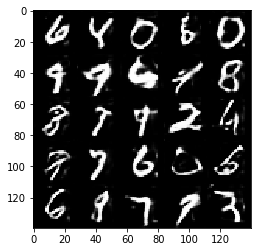

Epoch 2/2... Discriminator Loss: 0.7501... Generator Loss: 1.4607
Epoch 2/2... Discriminator Loss: 0.9161... Generator Loss: 2.6590
Epoch 2/2... Discriminator Loss: 1.1303... Generator Loss: 0.7906


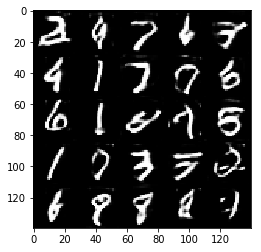

Epoch 2/2... Discriminator Loss: 1.5715... Generator Loss: 0.5187
Epoch 2/2... Discriminator Loss: 0.9161... Generator Loss: 1.0049
Epoch 2/2... Discriminator Loss: 0.7282... Generator Loss: 1.3519


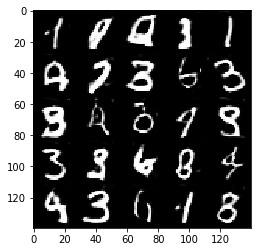

Epoch 2/2... Discriminator Loss: 1.1323... Generator Loss: 1.7909
Epoch 2/2... Discriminator Loss: 0.7054... Generator Loss: 2.0514
Epoch 2/2... Discriminator Loss: 1.7012... Generator Loss: 2.5092


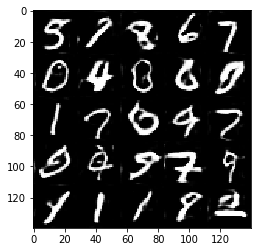

Epoch 2/2... Discriminator Loss: 0.7910... Generator Loss: 1.7158
Epoch 2/2... Discriminator Loss: 0.6604... Generator Loss: 2.0497
Epoch 2/2... Discriminator Loss: 0.5892... Generator Loss: 2.3063


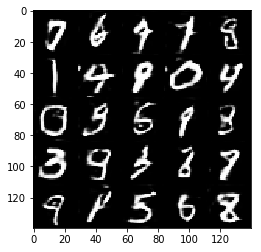

Epoch 2/2... Discriminator Loss: 0.7100... Generator Loss: 1.8968


In [121]:
batch_size = 64
z_dim = 100
learning_rate = 0.0007
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.3194... Generator Loss: 2.9654
Epoch 1/1... Discriminator Loss: 2.6292... Generator Loss: 7.7159
Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 1.6848


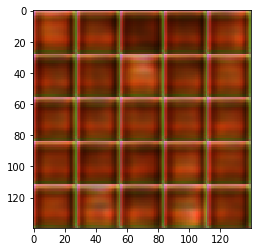

Epoch 1/1... Discriminator Loss: 1.2314... Generator Loss: 3.2252
Epoch 1/1... Discriminator Loss: 2.1994... Generator Loss: 3.9144
Epoch 1/1... Discriminator Loss: 0.8425... Generator Loss: 1.5262


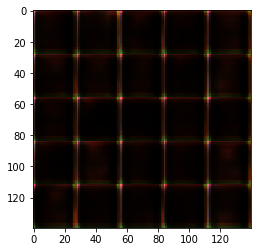

Epoch 1/1... Discriminator Loss: 1.9388... Generator Loss: 3.2523
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 2.4950
Epoch 1/1... Discriminator Loss: 1.2188... Generator Loss: 1.4688


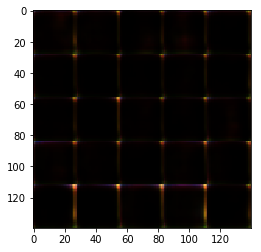

Epoch 1/1... Discriminator Loss: 1.1669... Generator Loss: 1.1979
Epoch 1/1... Discriminator Loss: 1.2626... Generator Loss: 1.4484
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 2.4512


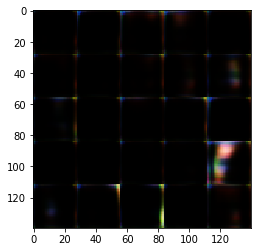

Epoch 1/1... Discriminator Loss: 1.2608... Generator Loss: 1.5446
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 1.5820
Epoch 1/1... Discriminator Loss: 1.1189... Generator Loss: 1.8081


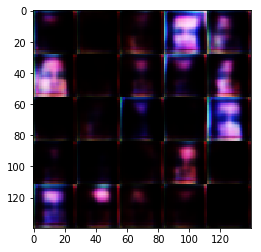

Epoch 1/1... Discriminator Loss: 1.2175... Generator Loss: 1.7219
Epoch 1/1... Discriminator Loss: 1.3327... Generator Loss: 2.1384
Epoch 1/1... Discriminator Loss: 1.0253... Generator Loss: 2.0494


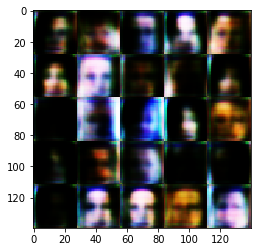

Epoch 1/1... Discriminator Loss: 1.1899... Generator Loss: 1.1453
Epoch 1/1... Discriminator Loss: 1.1549... Generator Loss: 1.2503
Epoch 1/1... Discriminator Loss: 1.4609... Generator Loss: 0.4688


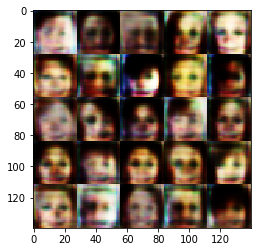

Epoch 1/1... Discriminator Loss: 1.8323... Generator Loss: 0.3118
Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.5276
Epoch 1/1... Discriminator Loss: 1.4274... Generator Loss: 0.4831


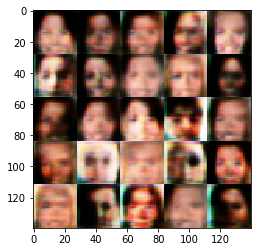

Epoch 1/1... Discriminator Loss: 1.6358... Generator Loss: 0.3794
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.5020
Epoch 1/1... Discriminator Loss: 1.1636... Generator Loss: 0.6511


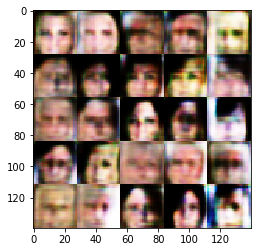

Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.4471
Epoch 1/1... Discriminator Loss: 1.4736... Generator Loss: 0.4468
Epoch 1/1... Discriminator Loss: 2.1015... Generator Loss: 0.2296


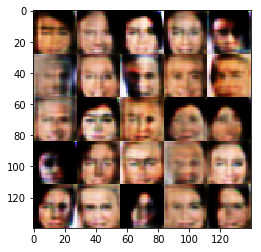

Epoch 1/1... Discriminator Loss: 1.6640... Generator Loss: 0.3403
Epoch 1/1... Discriminator Loss: 1.5014... Generator Loss: 0.4370
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.4941


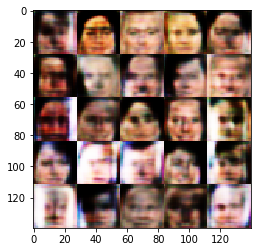

Epoch 1/1... Discriminator Loss: 1.3903... Generator Loss: 0.4929
Epoch 1/1... Discriminator Loss: 1.3781... Generator Loss: 0.4875
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.4793


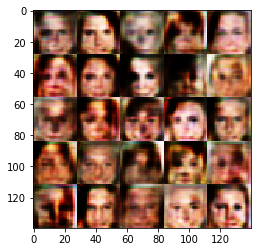

Epoch 1/1... Discriminator Loss: 1.5285... Generator Loss: 0.4115
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.6026
Epoch 1/1... Discriminator Loss: 1.5004... Generator Loss: 0.4488


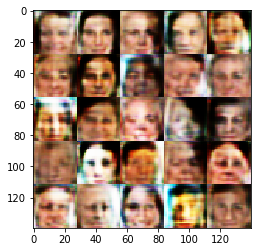

Epoch 1/1... Discriminator Loss: 1.6889... Generator Loss: 0.3494
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.5224
Epoch 1/1... Discriminator Loss: 1.5902... Generator Loss: 0.4072


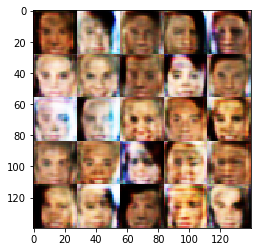

Epoch 1/1... Discriminator Loss: 1.6214... Generator Loss: 0.3940
Epoch 1/1... Discriminator Loss: 1.6156... Generator Loss: 0.3610
Epoch 1/1... Discriminator Loss: 1.4760... Generator Loss: 0.4416


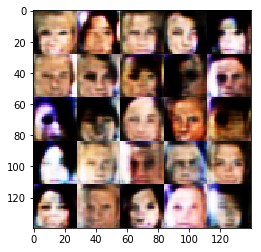

Epoch 1/1... Discriminator Loss: 1.3436... Generator Loss: 0.5421
Epoch 1/1... Discriminator Loss: 1.6443... Generator Loss: 0.3955
Epoch 1/1... Discriminator Loss: 1.8455... Generator Loss: 0.3020


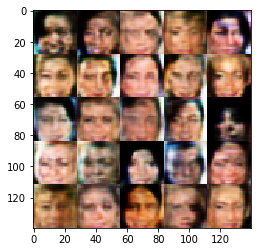

Epoch 1/1... Discriminator Loss: 1.6180... Generator Loss: 0.4080
Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.5779
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.4829


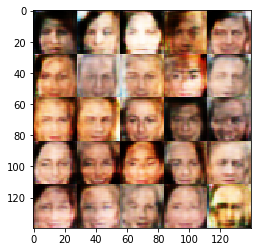

Epoch 1/1... Discriminator Loss: 1.5567... Generator Loss: 0.4433
Epoch 1/1... Discriminator Loss: 1.4566... Generator Loss: 0.4441
Epoch 1/1... Discriminator Loss: 1.2339... Generator Loss: 0.6342


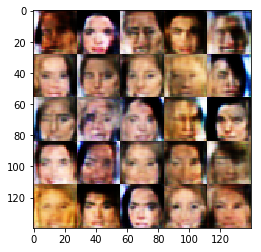

Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 2.1558
Epoch 1/1... Discriminator Loss: 1.6628... Generator Loss: 2.2742
Epoch 1/1... Discriminator Loss: 1.1184... Generator Loss: 1.9149


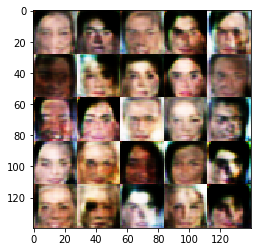

Epoch 1/1... Discriminator Loss: 1.6212... Generator Loss: 2.7583
Epoch 1/1... Discriminator Loss: 0.9219... Generator Loss: 1.8318
Epoch 1/1... Discriminator Loss: 1.0443... Generator Loss: 1.3415


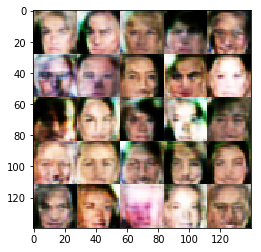

Epoch 1/1... Discriminator Loss: 1.4006... Generator Loss: 2.1133
Epoch 1/1... Discriminator Loss: 1.5103... Generator Loss: 2.6816
Epoch 1/1... Discriminator Loss: 1.1225... Generator Loss: 1.6208


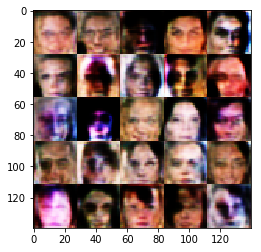

Epoch 1/1... Discriminator Loss: 0.9855... Generator Loss: 1.4209
Epoch 1/1... Discriminator Loss: 1.0737... Generator Loss: 1.3059
Epoch 1/1... Discriminator Loss: 1.1517... Generator Loss: 1.6530


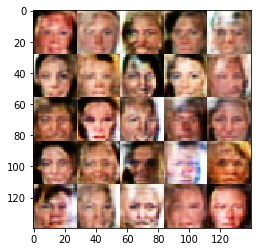

Epoch 1/1... Discriminator Loss: 1.0909... Generator Loss: 1.8878
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 1.9512
Epoch 1/1... Discriminator Loss: 1.1520... Generator Loss: 1.2667


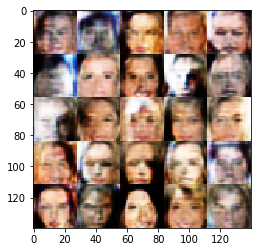

Epoch 1/1... Discriminator Loss: 1.6257... Generator Loss: 0.3642
Epoch 1/1... Discriminator Loss: 1.4415... Generator Loss: 0.5197
Epoch 1/1... Discriminator Loss: 1.8246... Generator Loss: 0.2962


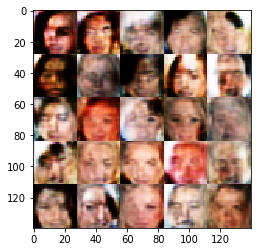

Epoch 1/1... Discriminator Loss: 0.9411... Generator Loss: 1.0719
Epoch 1/1... Discriminator Loss: 1.5016... Generator Loss: 2.0439
Epoch 1/1... Discriminator Loss: 1.2292... Generator Loss: 1.2760


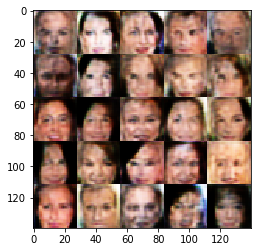

Epoch 1/1... Discriminator Loss: 1.9206... Generator Loss: 0.2697
Epoch 1/1... Discriminator Loss: 1.6049... Generator Loss: 0.3851
Epoch 1/1... Discriminator Loss: 1.9313... Generator Loss: 0.2807


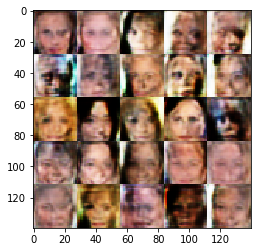

Epoch 1/1... Discriminator Loss: 1.6138... Generator Loss: 0.4093
Epoch 1/1... Discriminator Loss: 1.7231... Generator Loss: 0.3273
Epoch 1/1... Discriminator Loss: 1.3724... Generator Loss: 0.5107


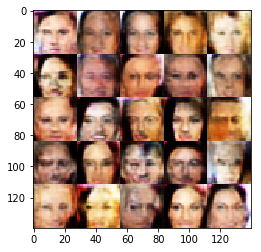

Epoch 1/1... Discriminator Loss: 1.4464... Generator Loss: 0.4404
Epoch 1/1... Discriminator Loss: 1.4795... Generator Loss: 0.4463
Epoch 1/1... Discriminator Loss: 1.7268... Generator Loss: 0.3371


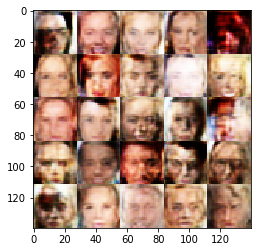

Epoch 1/1... Discriminator Loss: 1.4358... Generator Loss: 0.4696
Epoch 1/1... Discriminator Loss: 1.8668... Generator Loss: 0.2884
Epoch 1/1... Discriminator Loss: 1.0189... Generator Loss: 1.5378


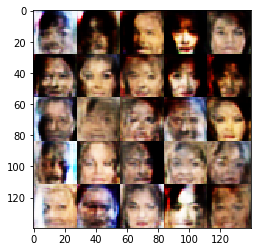

Epoch 1/1... Discriminator Loss: 1.0742... Generator Loss: 1.6138
Epoch 1/1... Discriminator Loss: 1.0530... Generator Loss: 1.5554
Epoch 1/1... Discriminator Loss: 1.3002... Generator Loss: 0.5691


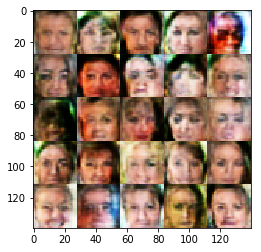

Epoch 1/1... Discriminator Loss: 1.8586... Generator Loss: 0.2926
Epoch 1/1... Discriminator Loss: 1.5967... Generator Loss: 0.3720
Epoch 1/1... Discriminator Loss: 1.6443... Generator Loss: 0.3524


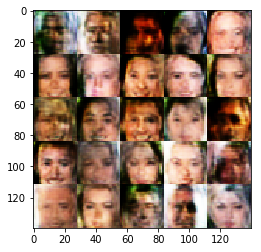

Epoch 1/1... Discriminator Loss: 1.6810... Generator Loss: 0.3523
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 0.6560
Epoch 1/1... Discriminator Loss: 1.5356... Generator Loss: 1.9670


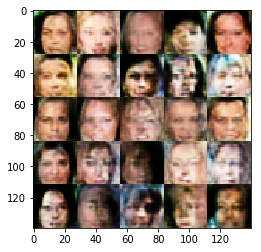

Epoch 1/1... Discriminator Loss: 1.1342... Generator Loss: 1.2506
Epoch 1/1... Discriminator Loss: 1.3205... Generator Loss: 1.7748
Epoch 1/1... Discriminator Loss: 1.0251... Generator Loss: 1.5970


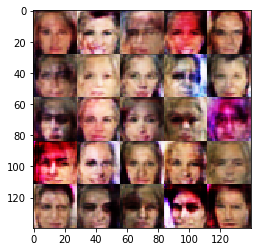

Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 1.4339
Epoch 1/1... Discriminator Loss: 1.0082... Generator Loss: 1.1757
Epoch 1/1... Discriminator Loss: 1.2293... Generator Loss: 1.8863


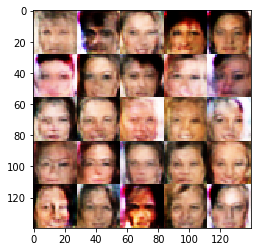

Epoch 1/1... Discriminator Loss: 1.1955... Generator Loss: 1.7577
Epoch 1/1... Discriminator Loss: 1.6323... Generator Loss: 0.3675
Epoch 1/1... Discriminator Loss: 1.2132... Generator Loss: 0.6277


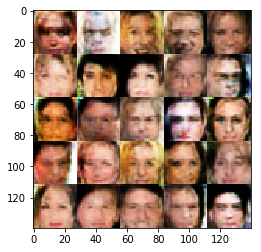

Epoch 1/1... Discriminator Loss: 1.3286... Generator Loss: 2.0532
Epoch 1/1... Discriminator Loss: 1.1888... Generator Loss: 1.5089
Epoch 1/1... Discriminator Loss: 1.2102... Generator Loss: 0.8885


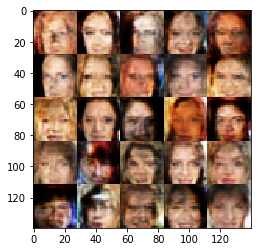

Epoch 1/1... Discriminator Loss: 1.0683... Generator Loss: 1.1116
Epoch 1/1... Discriminator Loss: 1.1694... Generator Loss: 1.8394
Epoch 1/1... Discriminator Loss: 1.0849... Generator Loss: 1.2503


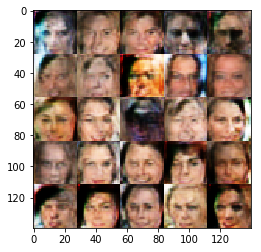

Epoch 1/1... Discriminator Loss: 1.0403... Generator Loss: 1.1167
Epoch 1/1... Discriminator Loss: 1.3357... Generator Loss: 1.1560
Epoch 1/1... Discriminator Loss: 1.2004... Generator Loss: 1.8472


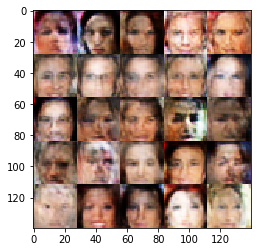

Epoch 1/1... Discriminator Loss: 1.1614... Generator Loss: 1.2165
Epoch 1/1... Discriminator Loss: 1.1157... Generator Loss: 0.9239
Epoch 1/1... Discriminator Loss: 1.1154... Generator Loss: 0.9913


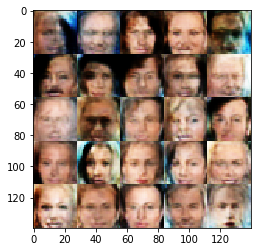

Epoch 1/1... Discriminator Loss: 1.1086... Generator Loss: 1.0604
Epoch 1/1... Discriminator Loss: 1.9483... Generator Loss: 0.2572
Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.4913


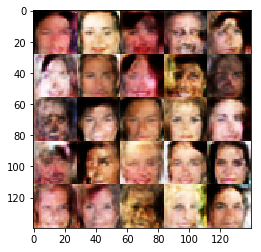

Epoch 1/1... Discriminator Loss: 1.3300... Generator Loss: 0.5595
Epoch 1/1... Discriminator Loss: 1.4361... Generator Loss: 0.4653
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.6288


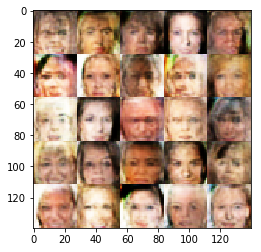

Epoch 1/1... Discriminator Loss: 2.1571... Generator Loss: 0.2046
Epoch 1/1... Discriminator Loss: 1.6425... Generator Loss: 0.3998
Epoch 1/1... Discriminator Loss: 1.4852... Generator Loss: 0.4402


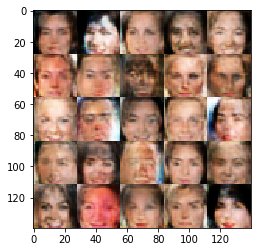

Epoch 1/1... Discriminator Loss: 1.2962... Generator Loss: 0.5842
Epoch 1/1... Discriminator Loss: 1.3148... Generator Loss: 1.8266
Epoch 1/1... Discriminator Loss: 0.8972... Generator Loss: 1.7137


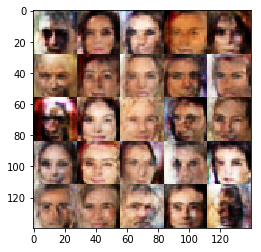

Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 1.5742
Epoch 1/1... Discriminator Loss: 1.4654... Generator Loss: 0.4292
Epoch 1/1... Discriminator Loss: 1.4927... Generator Loss: 0.4149


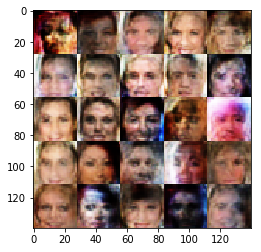

Epoch 1/1... Discriminator Loss: 2.0178... Generator Loss: 0.2425
Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 0.5213
Epoch 1/1... Discriminator Loss: 1.4904... Generator Loss: 0.4439


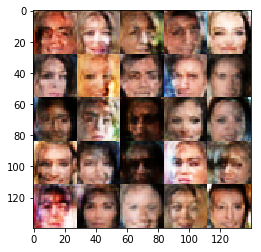

Epoch 1/1... Discriminator Loss: 1.4804... Generator Loss: 0.4352
Epoch 1/1... Discriminator Loss: 1.2397... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.6116... Generator Loss: 0.3815


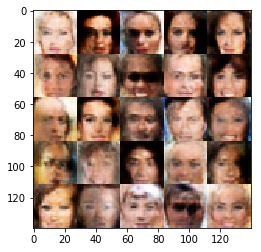

Epoch 1/1... Discriminator Loss: 1.7312... Generator Loss: 0.3431
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.4907
Epoch 1/1... Discriminator Loss: 1.1058... Generator Loss: 1.3245


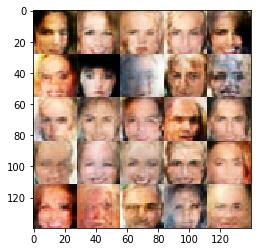

Epoch 1/1... Discriminator Loss: 1.3919... Generator Loss: 1.1059
Epoch 1/1... Discriminator Loss: 1.0976... Generator Loss: 1.2104
Epoch 1/1... Discriminator Loss: 1.4875... Generator Loss: 0.4562


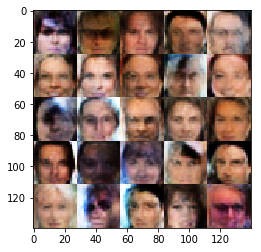

Epoch 1/1... Discriminator Loss: 1.7422... Generator Loss: 0.3009
Epoch 1/1... Discriminator Loss: 1.5524... Generator Loss: 0.3846
Epoch 1/1... Discriminator Loss: 1.5448... Generator Loss: 0.4055


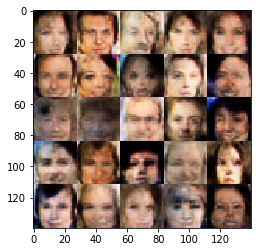

Epoch 1/1... Discriminator Loss: 1.6915... Generator Loss: 0.3618
Epoch 1/1... Discriminator Loss: 1.4595... Generator Loss: 0.4440
Epoch 1/1... Discriminator Loss: 1.9650... Generator Loss: 0.2494


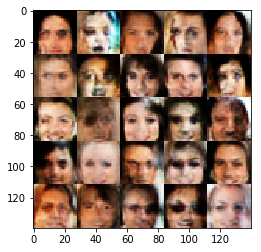

Epoch 1/1... Discriminator Loss: 1.1230... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.1516... Generator Loss: 1.6370
Epoch 1/1... Discriminator Loss: 1.2815... Generator Loss: 0.6029


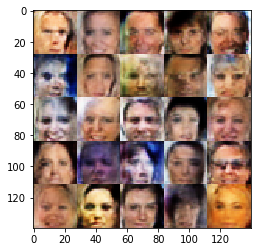

Epoch 1/1... Discriminator Loss: 1.0955... Generator Loss: 0.8546
Epoch 1/1... Discriminator Loss: 1.2720... Generator Loss: 1.3231
Epoch 1/1... Discriminator Loss: 1.1706... Generator Loss: 1.5724


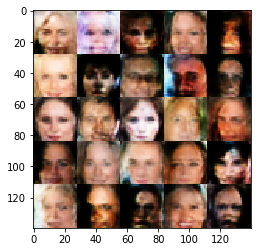

Epoch 1/1... Discriminator Loss: 1.3398... Generator Loss: 1.2495
Epoch 1/1... Discriminator Loss: 1.0731... Generator Loss: 1.4442
Epoch 1/1... Discriminator Loss: 1.1455... Generator Loss: 1.1515


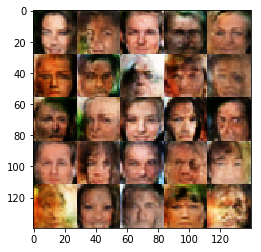

Epoch 1/1... Discriminator Loss: 1.0884... Generator Loss: 1.5153
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.9221
Epoch 1/1... Discriminator Loss: 1.4529... Generator Loss: 2.0371


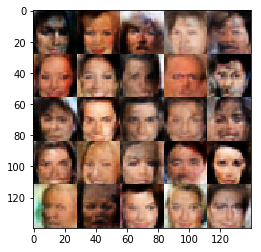

Epoch 1/1... Discriminator Loss: 1.0664... Generator Loss: 0.9633
Epoch 1/1... Discriminator Loss: 1.1221... Generator Loss: 1.2533
Epoch 1/1... Discriminator Loss: 1.1646... Generator Loss: 0.9816


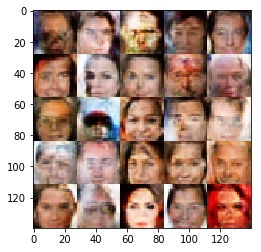

Epoch 1/1... Discriminator Loss: 1.1513... Generator Loss: 0.7946
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 1.6792
Epoch 1/1... Discriminator Loss: 1.2088... Generator Loss: 1.2819


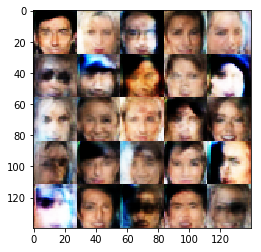

Epoch 1/1... Discriminator Loss: 1.1178... Generator Loss: 1.3697
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 1.5936
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 1.6256


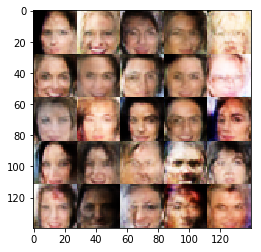

Epoch 1/1... Discriminator Loss: 1.2359... Generator Loss: 1.3817
Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 1.3098
Epoch 1/1... Discriminator Loss: 0.9642... Generator Loss: 1.6470


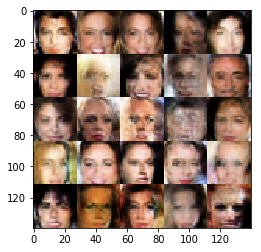

Epoch 1/1... Discriminator Loss: 1.0755... Generator Loss: 1.1753
Epoch 1/1... Discriminator Loss: 1.1670... Generator Loss: 1.7990
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.6412


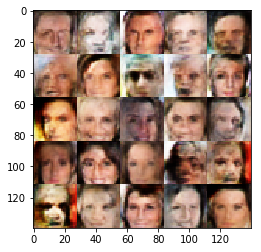

Epoch 1/1... Discriminator Loss: 1.1947... Generator Loss: 0.8836
Epoch 1/1... Discriminator Loss: 1.2315... Generator Loss: 1.7031
Epoch 1/1... Discriminator Loss: 1.4180... Generator Loss: 1.5754


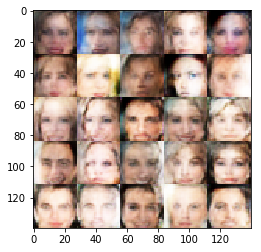

Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 1.3261
Epoch 1/1... Discriminator Loss: 1.2088... Generator Loss: 0.9245
Epoch 1/1... Discriminator Loss: 1.1618... Generator Loss: 1.3674


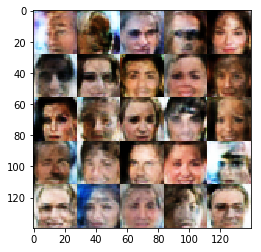

Epoch 1/1... Discriminator Loss: 1.4177... Generator Loss: 0.4891
Epoch 1/1... Discriminator Loss: 1.7615... Generator Loss: 0.3039
Epoch 1/1... Discriminator Loss: 1.7962... Generator Loss: 0.3078


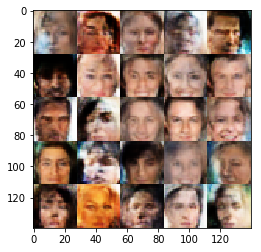

Epoch 1/1... Discriminator Loss: 1.1619... Generator Loss: 1.3193
Epoch 1/1... Discriminator Loss: 1.1771... Generator Loss: 1.2923
Epoch 1/1... Discriminator Loss: 1.1101... Generator Loss: 1.3739


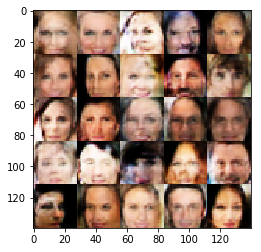

Epoch 1/1... Discriminator Loss: 1.1046... Generator Loss: 1.5254
Epoch 1/1... Discriminator Loss: 1.1243... Generator Loss: 0.9636
Epoch 1/1... Discriminator Loss: 1.3150... Generator Loss: 1.7485


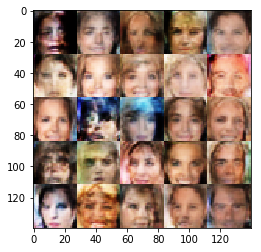

Epoch 1/1... Discriminator Loss: 1.2863... Generator Loss: 1.3109
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.3130... Generator Loss: 1.6685


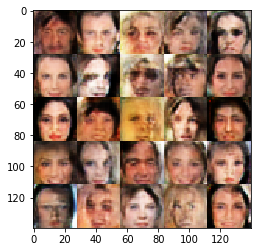

Epoch 1/1... Discriminator Loss: 1.2575... Generator Loss: 1.3111
Epoch 1/1... Discriminator Loss: 1.2311... Generator Loss: 0.7674
Epoch 1/1... Discriminator Loss: 1.0731... Generator Loss: 1.0074


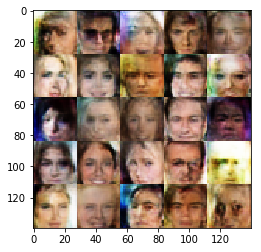

Epoch 1/1... Discriminator Loss: 1.2810... Generator Loss: 1.7179
Epoch 1/1... Discriminator Loss: 1.2755... Generator Loss: 1.7790
Epoch 1/1... Discriminator Loss: 1.1485... Generator Loss: 0.8580


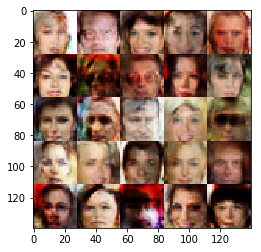

Epoch 1/1... Discriminator Loss: 1.1416... Generator Loss: 0.9879
Epoch 1/1... Discriminator Loss: 1.5985... Generator Loss: 0.3869
Epoch 1/1... Discriminator Loss: 2.1466... Generator Loss: 0.2003


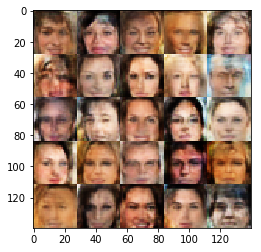

Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.5098
Epoch 1/1... Discriminator Loss: 1.2350... Generator Loss: 1.6020
Epoch 1/1... Discriminator Loss: 1.1948... Generator Loss: 1.0888


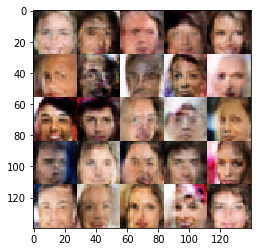

Epoch 1/1... Discriminator Loss: 1.0572... Generator Loss: 1.6247
Epoch 1/1... Discriminator Loss: 1.1058... Generator Loss: 0.8855
Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 1.4680


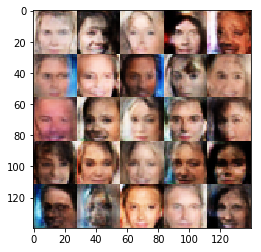

Epoch 1/1... Discriminator Loss: 1.0897... Generator Loss: 1.1897
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 0.6205
Epoch 1/1... Discriminator Loss: 1.6287... Generator Loss: 0.3593


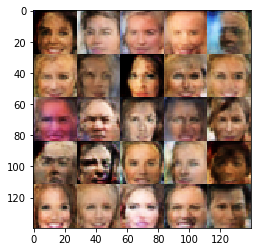

Epoch 1/1... Discriminator Loss: 1.5434... Generator Loss: 0.4503
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.4877
Epoch 1/1... Discriminator Loss: 1.8021... Generator Loss: 0.2951


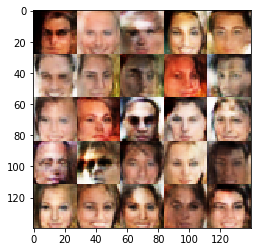

Epoch 1/1... Discriminator Loss: 1.6270... Generator Loss: 0.3961
Epoch 1/1... Discriminator Loss: 1.4391... Generator Loss: 0.5000
Epoch 1/1... Discriminator Loss: 1.6799... Generator Loss: 0.3527


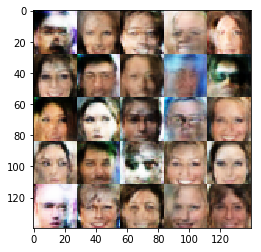

Epoch 1/1... Discriminator Loss: 1.6191... Generator Loss: 0.3967
Epoch 1/1... Discriminator Loss: 1.6807... Generator Loss: 0.3408
Epoch 1/1... Discriminator Loss: 1.0809... Generator Loss: 0.8692


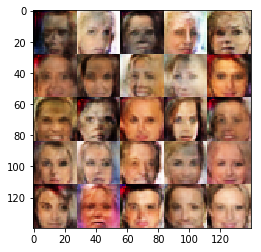

Epoch 1/1... Discriminator Loss: 1.1183... Generator Loss: 0.8823
Epoch 1/1... Discriminator Loss: 1.2986... Generator Loss: 0.5924
Epoch 1/1... Discriminator Loss: 1.3494... Generator Loss: 1.7844


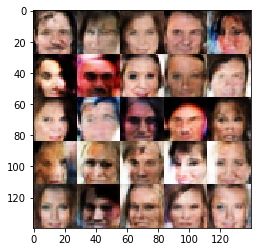

Epoch 1/1... Discriminator Loss: 1.3165... Generator Loss: 1.5130
Epoch 1/1... Discriminator Loss: 1.0886... Generator Loss: 1.0799
Epoch 1/1... Discriminator Loss: 1.3729... Generator Loss: 0.5097


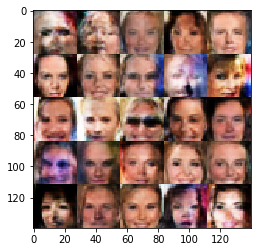

Epoch 1/1... Discriminator Loss: 1.1736... Generator Loss: 0.7682
Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 1.2422
Epoch 1/1... Discriminator Loss: 1.0789... Generator Loss: 1.0795


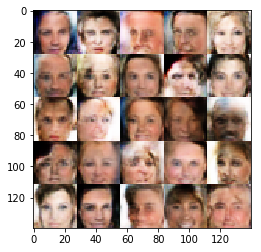

Epoch 1/1... Discriminator Loss: 1.1526... Generator Loss: 1.3315
Epoch 1/1... Discriminator Loss: 1.2216... Generator Loss: 1.1928
Epoch 1/1... Discriminator Loss: 1.0280... Generator Loss: 1.3266


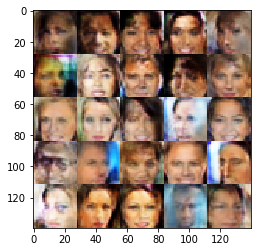

Epoch 1/1... Discriminator Loss: 1.2841... Generator Loss: 0.6390
Epoch 1/1... Discriminator Loss: 1.7349... Generator Loss: 0.3252
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 0.6541


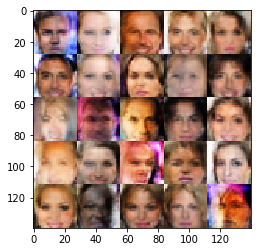

Epoch 1/1... Discriminator Loss: 1.1541... Generator Loss: 1.4989
Epoch 1/1... Discriminator Loss: 1.1928... Generator Loss: 1.3166
Epoch 1/1... Discriminator Loss: 1.1176... Generator Loss: 1.4683


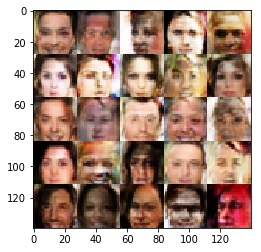

Epoch 1/1... Discriminator Loss: 1.0450... Generator Loss: 1.5337
Epoch 1/1... Discriminator Loss: 1.1607... Generator Loss: 1.1584
Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 1.4447


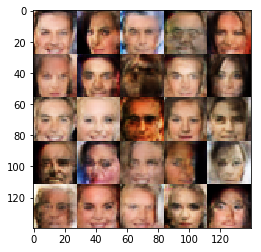

Epoch 1/1... Discriminator Loss: 1.1460... Generator Loss: 1.1927
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 1.5293
Epoch 1/1... Discriminator Loss: 1.2701... Generator Loss: 1.3080


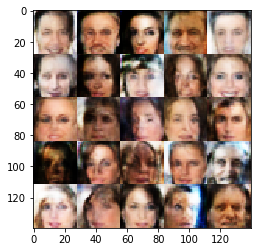

Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.6582
Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.5744
Epoch 1/1... Discriminator Loss: 1.0521... Generator Loss: 1.3567


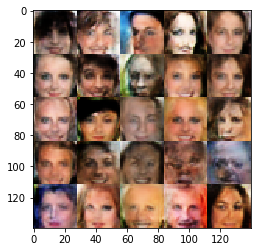

Epoch 1/1... Discriminator Loss: 1.1784... Generator Loss: 1.3907
Epoch 1/1... Discriminator Loss: 1.2740... Generator Loss: 0.7647
Epoch 1/1... Discriminator Loss: 1.1653... Generator Loss: 1.2328


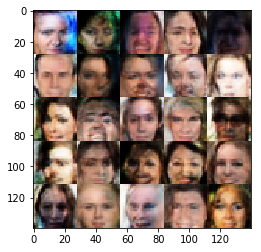

Epoch 1/1... Discriminator Loss: 1.2470... Generator Loss: 1.3847
Epoch 1/1... Discriminator Loss: 1.2163... Generator Loss: 0.9176
Epoch 1/1... Discriminator Loss: 1.1270... Generator Loss: 1.4707


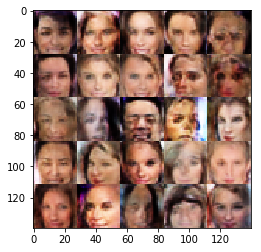

Epoch 1/1... Discriminator Loss: 1.1353... Generator Loss: 1.1168
Epoch 1/1... Discriminator Loss: 1.3441... Generator Loss: 0.7428
Epoch 1/1... Discriminator Loss: 1.2280... Generator Loss: 0.6447


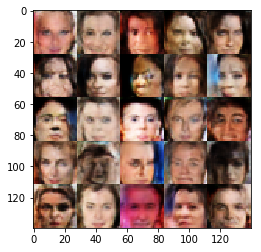

Epoch 1/1... Discriminator Loss: 1.8970... Generator Loss: 0.2739
Epoch 1/1... Discriminator Loss: 1.5544... Generator Loss: 0.3987
Epoch 1/1... Discriminator Loss: 1.9730... Generator Loss: 0.2484


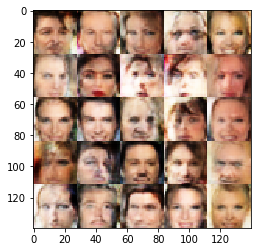

Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.5739
Epoch 1/1... Discriminator Loss: 1.3040... Generator Loss: 0.5513
Epoch 1/1... Discriminator Loss: 1.6175... Generator Loss: 0.3663


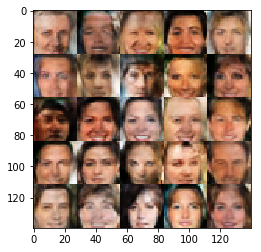

Epoch 1/1... Discriminator Loss: 1.5958... Generator Loss: 0.3719
Epoch 1/1... Discriminator Loss: 1.1581... Generator Loss: 0.8101
Epoch 1/1... Discriminator Loss: 1.3186... Generator Loss: 1.5387


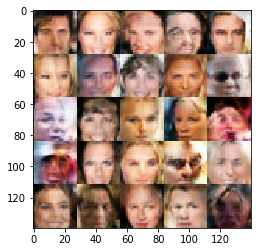

Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 1.2111
Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 1.0215
Epoch 1/1... Discriminator Loss: 1.1786... Generator Loss: 1.5732


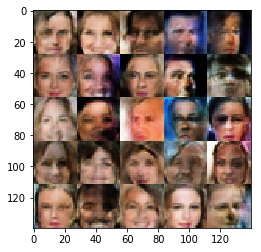

Epoch 1/1... Discriminator Loss: 1.4688... Generator Loss: 1.9509
Epoch 1/1... Discriminator Loss: 1.0691... Generator Loss: 0.9763
Epoch 1/1... Discriminator Loss: 1.0681... Generator Loss: 1.0389


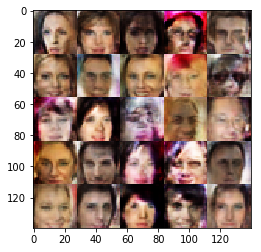

Epoch 1/1... Discriminator Loss: 1.7589... Generator Loss: 0.3123
Epoch 1/1... Discriminator Loss: 1.5543... Generator Loss: 0.3988
Epoch 1/1... Discriminator Loss: 1.7144... Generator Loss: 0.3362


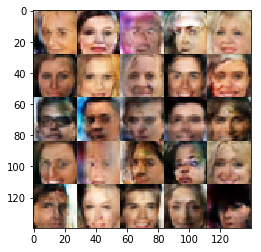

Epoch 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.4680
Epoch 1/1... Discriminator Loss: 1.8691... Generator Loss: 0.2797
Epoch 1/1... Discriminator Loss: 1.7471... Generator Loss: 0.3058


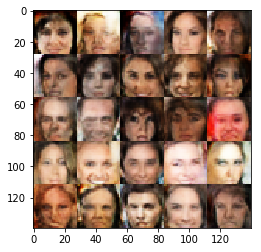

Epoch 1/1... Discriminator Loss: 1.6081... Generator Loss: 0.3884
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.3381... Generator Loss: 0.5426


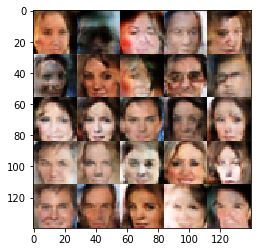

Epoch 1/1... Discriminator Loss: 1.6383... Generator Loss: 0.3665
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.4474
Epoch 1/1... Discriminator Loss: 1.4416... Generator Loss: 0.4787


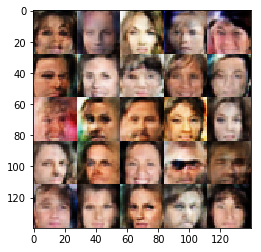

Epoch 1/1... Discriminator Loss: 1.6208... Generator Loss: 0.3593
Epoch 1/1... Discriminator Loss: 1.6984... Generator Loss: 0.3228
Epoch 1/1... Discriminator Loss: 1.7080... Generator Loss: 0.3355


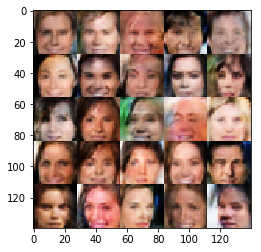

Epoch 1/1... Discriminator Loss: 1.4903... Generator Loss: 0.4210
Epoch 1/1... Discriminator Loss: 1.1727... Generator Loss: 0.7122
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 1.7131


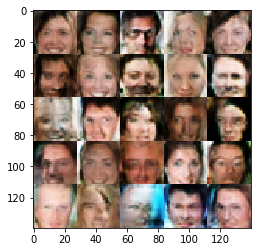

Epoch 1/1... Discriminator Loss: 1.0845... Generator Loss: 1.0185
Epoch 1/1... Discriminator Loss: 1.0666... Generator Loss: 1.6231
Epoch 1/1... Discriminator Loss: 1.2968... Generator Loss: 1.6166


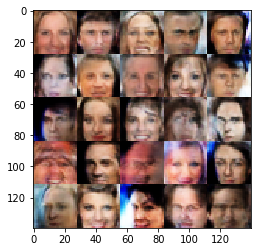

Epoch 1/1... Discriminator Loss: 1.1523... Generator Loss: 1.1100
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 0.8843
Epoch 1/1... Discriminator Loss: 1.6891... Generator Loss: 0.3189


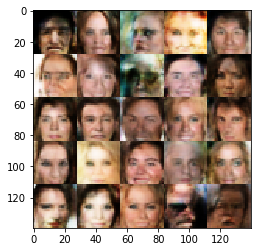

Epoch 1/1... Discriminator Loss: 1.6234... Generator Loss: 0.3593
Epoch 1/1... Discriminator Loss: 1.7608... Generator Loss: 0.3369
Epoch 1/1... Discriminator Loss: 1.7969... Generator Loss: 0.2905


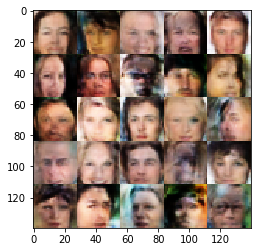

Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.4793
Epoch 1/1... Discriminator Loss: 1.6583... Generator Loss: 0.3469
Epoch 1/1... Discriminator Loss: 1.2054... Generator Loss: 0.6559


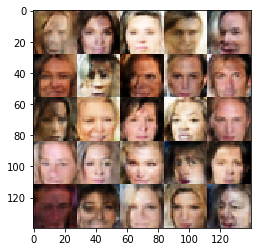

Epoch 1/1... Discriminator Loss: 1.1084... Generator Loss: 1.2459
Epoch 1/1... Discriminator Loss: 0.9221... Generator Loss: 1.3698
Epoch 1/1... Discriminator Loss: 1.1126... Generator Loss: 1.3190


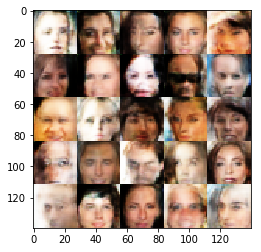

Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 1.3245
Epoch 1/1... Discriminator Loss: 1.2184... Generator Loss: 0.8205
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 1.7103


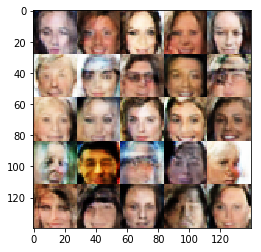

Epoch 1/1... Discriminator Loss: 1.1307... Generator Loss: 0.8840
Epoch 1/1... Discriminator Loss: 1.2801... Generator Loss: 0.7874
Epoch 1/1... Discriminator Loss: 1.1257... Generator Loss: 0.8233


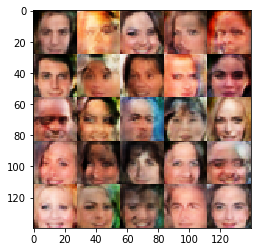

Epoch 1/1... Discriminator Loss: 1.1540... Generator Loss: 0.8903
Epoch 1/1... Discriminator Loss: 1.5684... Generator Loss: 1.9072
Epoch 1/1... Discriminator Loss: 1.0931... Generator Loss: 0.8414


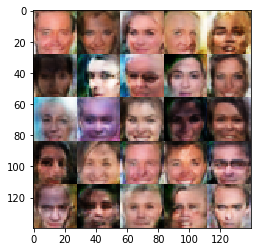

Epoch 1/1... Discriminator Loss: 1.4311... Generator Loss: 0.4672


In [116]:
batch_size = 64
z_dim = 100
learning_rate = 0.0005
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.